In [ ]:
!pip install statsmodels==0.12.2
!pip install optuna
!pip install path

     |████████████████████████████████| 9.5 MB 5.1 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2
     |████████████████████████████████| 308 kB 5.5 MB/s 
     |████████████████████████████████| 81 kB 7.8 MB/s 
     |████████████████████████████████| 210 kB 26.1 MB/s 
     |████████████████████████████████| 78 kB 5.6 MB/s 
     |████████████████████████████████| 113 kB 42.9 MB/s 
     |████████████████████████████████| 49 kB 4.9 MB/s 
     |████████████████████████████████| 150 kB 40.3 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=a8cf401d1fccb4d25b7fd4093b4e41cab561643252798908573e968816c9c2a7
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder

import random
from datetime import datetime, timedelta
from tqdm import tqdm

from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly

import scipy.stats as sps
import statsmodels.graphics.tsaplots as tsaplots
import math

import statsmodels.api as sm

In [ ]:

from sklearn.metrics import mean_squared_error, mean_squared_log_error
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor

import time
import os
from typing_extensions import Literal
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess, Fourier

import optuna
from optuna.samplers import TPESampler


from joblib import Parallel, delayed
import warnings

from path import Path

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train = pd.read_csv('drive/MyDrive/Colab/store_sales/train.csv')
test = pd.read_csv('drive/MyDrive/Colab/store_sales/test.csv')
stores = pd.read_csv('drive/MyDrive/Colab/store_sales/stores.csv')
oil = pd.read_csv('drive/MyDrive/Colab/store_sales/oil.csv')
transactions = pd.read_csv('drive/MyDrive/Colab/store_sales/transactions.csv')
holidays_events = pd.read_csv ('drive/MyDrive/Colab/store_sales/holidays_events.csv')

In [ ]:
def set_seed(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

In [ ]:
path = Path('/content')

Описание фичей:

date: Дата

store_nbr: номер магазина

sales: товарооборот (целевая переменная)

family: Тип товаров

store_type: Тип магазина

cluster: Кластер

city: Город

state: В каком штате находится магазин

onpromotion: Проводится ли промоакция в этот день

holiday_type & locale : Праздничный ли это день и если да, то тип праздника

transactions: число транзакций

sales: объем продаж

**АНАЛИЗ ДАННЫХ**

In [ ]:
print('Number of train samples: ', train.shape)
print('Number of test samples: ', test.shape)
print('Number of stores: ', stores.shape)
print('Number of Holidays events: ', holidays_events.shape)
print('Number of Oil Price data: ', oil.shape)
print('Number of features (train): ', len(train.columns))
print(train.info())
print(train.columns)
print(train.head())

Number of train samples:  (3000888, 6)
Number of test samples:  (28512, 5)
Number of stores:  (54, 5)
Number of Holidays events:  (350, 6)
Number of Oil Price data:  (1218, 2)
Number of features (train):  6
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB
None
Index(['id', 'date', 'store_nbr', 'family', 'sales', 'onpromotion'], dtype='object')
   id        date  store_nbr      family  sales  onpromotion
0   0  2013-01-01          1  AUTOMOTIVE    0.0            0
1   1  2013-01-01          1   BABY CARE    0.0            0
2   2  2013-01-01          1      BEAUTY    0.0            0
3   3  2013-01-01          1   BEVERAGES    0.0            0
4   4  2013-01

In [ ]:
print('Missing values in train:', train.isna().sum().sum())
print('Missing values in test:', test.isna().sum().sum())

Missing values in train: 0
Missing values in test: 0


In [ ]:
train['date'] = pd.to_datetime(train['date'])
test['date'] = pd.to_datetime(test['date'])
oil['date'] = pd.to_datetime(oil['date'])
holidays_events['date'] = pd.to_datetime(holidays_events['date'])
transactions['date'] = pd.to_datetime(transactions['date'])

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB


In [ ]:
temp = train.set_index('date').groupby('store_nbr').resample('D').sales.sum().reset_index()
px.line(temp, x='date', y='sales', color='store_nbr',
        title= ' Ежедневный объем продаж магазинов')

In [ ]:
temp.head()

,store_nbr,date,sales
0,1,2013-01-01,0.000000
1,1,2013-01-02,7417.148000
2,1,2013-01-03,5873.244001
3,1,2013-01-04,5919.879001
4,1,2013-01-05,6318.785010


**Transactions**

In [ ]:
print('Missing values in transactions:', train.isna().sum().sum())

Missing values in transactions: 0


In [ ]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y="transactions" , color = "month", title = "Transactions")

In [ ]:
store_group = transactions.groupby("store_nbr")["transactions"].sum().reset_index()

Количество транзакций в магазинах

In [ ]:
px.line(store_group, x="store_nbr", y="transactions", title = "Количество транзакций по магазинам")

Временной ряд транзакций в зависимости от года

In [ ]:
a = transactions.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
b = a.groupby(["month","year"])["transactions"].sum().reset_index()
px.line(b, x="month", y="transactions" ,color="year", title = "Количество транзакций по месяцам в течении года")

Проверяем меняется ли количество транзакция в зависимости от дня недели

In [ ]:
temp = pd.merge(train.groupby(['date', 'store_nbr']).sales.sum().reset_index(),
                transactions, how='left')
print(temp.corr("spearman").sales.loc["transactions"])

temp = transactions.copy()
temp['year'] = temp.date.dt.year
temp['day_of_week'] = temp.date.dt.dayofweek + 1
temp = temp.groupby(['year', 'day_of_week']).transactions.mean().reset_index()

px.line(temp, x='day_of_week', y='transactions', color='year', title='Количество транзакция по дням недели')

0.8174644354591597


Транзакции в разных локациях

In [ ]:
store_transaction = pd.merge(stores,transactions,on="store_nbr")

In [ ]:
a = px.treemap(store_transaction,path=["state","city"],values="transactions",title="Количество транзакций по городам и провинциям")
a.show()

In [ ]:
a = px.pie(store_transaction,values="transactions",names="type")
a.show()

Text(0.5, 1.0, 'Sales Trend - month + year')

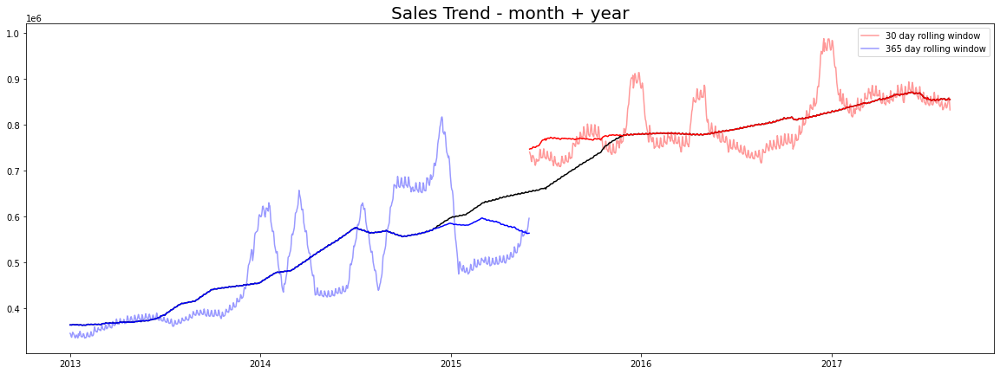

In [ ]:
fig, ax = plt.subplots(figsize=(20,7))
data_lim = train.loc[:, ["date", "sales"]][train.date>="2015-06"].groupby("date").sum()
data_pre = train.loc[:, ["date", "sales"]][train.date<"2015-06"].groupby("date").sum()
data = train.loc[:, ["date", "sales"]].groupby("date").sum()
#data.head()
ax.plot(data_lim.rolling(window=30,
                    center=True,
                    min_periods=15).mean(),
        aa=True,
        color="red",
        alpha=0.4
       )
ax.plot(data_pre.rolling(window=30,
                    center=True,
                    min_periods=15).mean(),
        aa=True,
        color="blue",
        alpha=0.4
       )
ax.plot(data.rolling(window=365,
                    center=True,
                    min_periods=182).mean(),
       aa=True,
       color="black"
       )
ax.plot(data_lim.rolling(window=365,
                        center=True,
                        min_periods=182).mean(),
       aa=True,
       color="red")
ax.plot(data_pre.rolling(window=365,
                        center=True,
                        min_periods=182).mean(),
       aa=True,
       color="blue")
ax.legend(['30 day rolling window', '365 day rolling window'])
ax.set_title("Sales Trend - month + year", fontsize=20)

Анализ по категориям товаров

findfont: Font family ['sansserif'] not found. Falling back to DejaVu Sans.


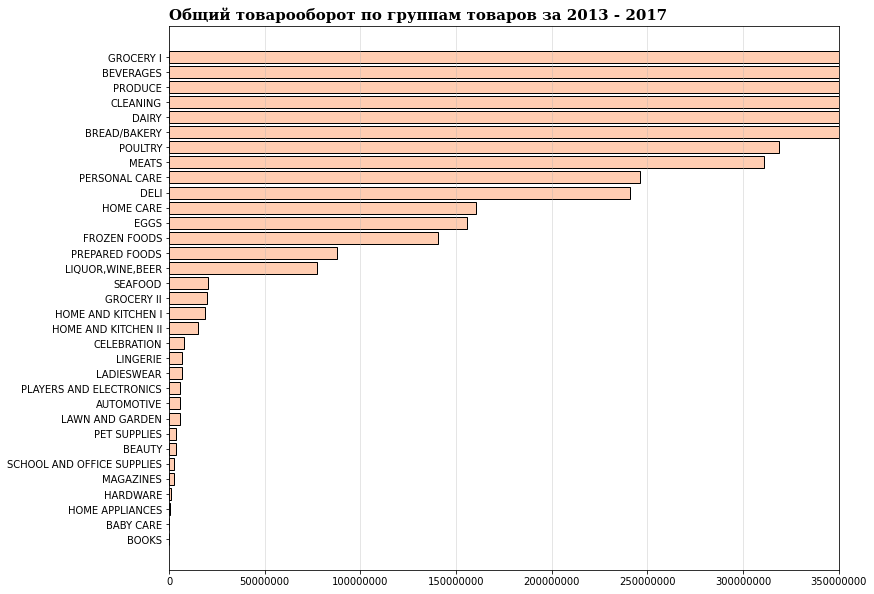

In [ ]:
fig , ax = plt.subplots(1,1,figsize = (12,10))

family_sales = train.groupby('family').sum().sort_values(by = 'sales',ascending = True)
ax.barh(family_sales.index,family_sales['sales'],linewidth = 1,edgecolor = 'Black', color = '#ffcdb2')

ax.set_xlim(0, 35000000)
ax.set_xticklabels(np.arange(0,350000001, 50000000),fontfamily='sansserif',color = 'Black')
ax.set_yticklabels(family_sales.index,fontfamily = 'sansserif',color = 'Black')
fig.text(0.125, 0.89, 'Общий товарооборот по группам товаров за 2013 - 2017', fontsize=15, fontweight='bold', fontfamily='serif')
ax.grid(axis='x', linestyle='-', alpha=0.4)
plt.show()

**Исследуем данные по ценам на нефть**

In [ ]:
oil_df = oil.set_index('date')['dcoilwtico'].resample(
    'D').sum().reset_index()
oil_df.head(10)

,date,dcoilwtico
0,2013-01-01,0.00
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-05,0.00
5,2013-01-06,0.00
6,2013-01-07,93.20
7,2013-01-08,93.21
8,2013-01-09,93.08
9,2013-01-10,93.81


Заполняем нулевые значения.

1) Заменяем значение "0" на "NaN" в столбце 'dcoilwtico'

2) Применяем метод интерполяции

In [ ]:
oil_df['dcoilwtico'] = np.where(oil_df['dcoilwtico']==0, np.nan, oil_df['dcoilwtico'])

oil_df['dcoilwtico_interpolated'] = oil_df.dcoilwtico.interpolate()

oil_df.head(10)

,date,dcoilwtico,dcoilwtico_interpolated
0,2013-01-01,NaN,NaN
1,2013-01-02,93.14,93.140000
2,2013-01-03,92.97,92.970000
3,2013-01-04,93.12,93.120000
4,2013-01-05,NaN,93.146667
5,2013-01-06,NaN,93.173333
6,2013-01-07,93.20,93.200000
7,2013-01-08,93.21,93.210000
8,2013-01-09,93.08,93.080000
9,2013-01-10,93.81,93.810000


In [ ]:
oil_rdy = oil_df.loc[:, ['date', 'dcoilwtico_interpolated']]
oil_rdy.iloc[0, 1] = 93.1

assert oil_rdy.isna().sum().sum() == 0

oil_rdy['date'] = pd.to_datetime(oil_rdy['date'])
oil_rdy['date'] = oil_rdy['date'].dt.to_period('D')
oil_rdy = oil_rdy.set_index(['date'])
oil_rdy

,dcoilwtico_interpolated
date,
2013-01-01,93.100000
2013-01-02,93.140000
2013-01-03,92.970000
2013-01-04,93.120000
2013-01-05,93.146667
...,...
2017-08-27,46.816667
2017-08-28,46.400000
2017-08-29,46.460000


Строим график ежедневных цен на нефть и интерполируемых

In [ ]:
temp = oil_df.melt(id_vars=['date'], var_name='Legend')
px.line(temp.sort_values(['Legend', 'date'], ascending=[False, True]), x='date', y='value', color='Legend', title='Ежедневные цены на нефть')

Проверяем, что цены на нефть даны вплоть до окончания временного ряда в тестовом датафрейме.

In [ ]:
oil_df.tail()

,date,dcoilwtico,dcoilwtico_interpolated
1699,2017-08-27,NaN,46.816667
1700,2017-08-28,46.40,46.400000
1701,2017-08-29,46.46,46.460000
1702,2017-08-30,45.96,45.960000
1703,2017-08-31,47.26,47.260000


In [ ]:
test.tail()

,id,date,store_nbr,family,onpromotion
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9
28511,3029399,2017-08-31,9,SEAFOOD,0


# Базовый корреляционный анализ

In [ ]:
# df_data_tmp = average_sales.copy().to_frame()
# # df_data.reset_index(inplace = True)
# average_trn = transactions.groupby('date').mean()['transactions'].to_frame()
# # average_trn.reset_index(inplace = True)
# # df_data = df_data.merge(average_trn, how="left", on='date')
# display(average_trn.head(3))
# display(df_data_tmp.head(3))

Посчитаем коэффициенты корреляции c onpromotion. Будем использовать критерии Спирмена и Кендалла.

Критерий Пирсона используется для нормально распределенных данных

In [ ]:
train_df = train.copy()
test_df = test.copy()
oil_df = oil.copy()
transactions_df = transactions.copy()
stores_df = stores.copy()
holidays_events_df = holidays_events.copy()

In [ ]:
df_data = pd.concat([train_df, test_df], sort=True)
df_data = df_data.merge(stores_df, how="left", on='store_nbr')
df_data = df_data.merge(oil_df, how="left", on='date')
df_data = df_data.merge(transactions_df, how="left", on=['date','store_nbr'])
df_data = df_data.merge(holidays_events_df,on='date',how='left')
df_data = df_data.rename(columns={'type_x' : 'store_type','type_y':'holiday_type'})

df_data.date = pd.to_datetime(df_data.date)
df_data['year'] = df_data['date'].dt.year
df_data['month'] = df_data['date'].dt.month
df_data['week'] = df_data['date'].dt.isocalendar().week
df_data['quarter'] = df_data['date'].dt.quarter
df_data['day_of_week'] = df_data['date'].dt.day_name()
df_data.head()

,date,family,id,onpromotion,sales,store_nbr,city,state,store_type,cluster,...,holiday_type,locale,locale_name,description,transferred,year,month,week,quarter,day_of_week
0,2013-01-01,AUTOMOTIVE,0,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
1,2013-01-01,BABY CARE,1,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
2,2013-01-01,BEAUTY,2,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
3,2013-01-01,BEVERAGES,3,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
4,2013-01-01,BOOKS,4,0,0.0,1,Quito,Pichincha,D,13,...,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday


In [ ]:
df_data.isnull().sum()

date                  0
family                0
id                    0
onpromotion           0
sales             28512
store_nbr             0
city                  0
state                 0
store_type            0
cluster               0
dcoilwtico       962280
transactions     277629
holiday_type    2578554
locale          2578554
locale_name     2578554
description     2578554
transferred     2578554
year                  0
month                 0
week                  0
quarter               0
day_of_week           0
dtype: int64

In [ ]:
# Подготовка данных
df_data['transactions'].fillna(value = 0, inplace = True)
df_data['sales'].fillna(value = 0, inplace = True)
df_data['locale'].fillna(value = '', inplace = True)
df_data['locale_name'].fillna(value = '', inplace = True)
df_data['description'].fillna(value = '', inplace = True)
df_data['holiday_type'].fillna(value = 'Working Day', inplace = True)
df_data['transferred'].fillna(value = False, inplace = True)

In [ ]:
display(df_data.tail(3))

,date,family,id,onpromotion,sales,store_nbr,city,state,store_type,cluster,...,holiday_type,locale,locale_name,description,transferred,year,month,week,quarter,day_of_week
3082857,2017-08-31,PRODUCE,3029397,1,0.0,9,Quito,Pichincha,B,6,...,Working Day,,,,False,2017,8,35,3,Thursday
3082858,2017-08-31,SCHOOL AND OFFICE SUPPLIES,3029398,9,0.0,9,Quito,Pichincha,B,6,...,Working Day,,,,False,2017,8,35,3,Thursday
3082859,2017-08-31,SEAFOOD,3029399,0,0.0,9,Quito,Pichincha,B,6,...,Working Day,,,,False,2017,8,35,3,Thursday


In [ ]:
# print("Корреляция Спирмана для sales и transaction: {:,.4f}".format(df_data.corr('spearman').sales.loc['onpromotion']))
print("Корреляция Кендала для sales и transaction: {:,.4f}".format(df_data.corr('kendall').sales.loc['onpromotion']))

Корреляция Кендала для sales и transaction: 0.4360


In [ ]:
train_aux = train_df[['date', 'sales', 'onpromotion']].groupby('date').mean()
train_aux = train_aux.reset_index()

In [ ]:
fig = px.scatter(train_aux[train_aux['onpromotion'] > 0], x="onpromotion", y="sales", color='sales',
                           color_continuous_scale="earth",
                 size='sales', log_x=True, size_max=30)

fig.update_layout({"title": f'Корреляция между OnPromotion и Sales (суммарные средние продажи и количеством промоакций ежедневно)',
                   "xaxis": {"title":"On Promotion"},
                   "yaxis": {"title":"Sales"},
                   "showlegend": False})
fig.show()

Можно увидеть, что корреляция между OnPromotion и Sales прямая, чем больше товаров на промоакциях в магазине, тем выше продажи

Теперь посмотрим на корреляцию между ценами на нефть и продажами

In [ ]:
sales_oil = train_df.groupby('date').mean()['sales']
sales_oil = sales_oil.reset_index()
sales_oil = pd.merge(sales_oil, oil_df, on ='date', how='left')
# we don't have all the oil prices available, we impute them
previous_price = 93.14
for index, row in sales_oil.iterrows():
    if math.isnan(row['dcoilwtico']):
        sales_oil.loc[sales_oil['date'] == row['date'], 'dcoilwtico'] = previous_price
    else:
        previous_price = row['dcoilwtico']

In [ ]:
fig = px.scatter(sales_oil, x="dcoilwtico", y="sales", size='sales', color='sales',
                  color_continuous_scale="pinkyl")

fig.update_layout({"title": f'Корреляция между Ценами на нефть и продажами',
                   "xaxis": {"title":"Oil Price"},
                   "yaxis": {"title":"Sales"},
                   "showlegend": False})
fig.show()

Здесь можем отметить обратную корреляцию, самые большие продажи были, когда цены на нефть были низкие

Теперь посмотрим на зависимость продаж от празжничных дней

In [ ]:
holidays_events_df1 = holidays_events_df[(holidays_events_df['date'] >= "2013-01-01") & (holidays_events_df['date'] <= "2017-08-15")]

In [ ]:
holidays_events_df1.head()

,date,type,locale,locale_name,description,transferred
41,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False
42,2013-01-05,Work Day,National,Ecuador,Recupero puente Navidad,False
43,2013-01-12,Work Day,National,Ecuador,Recupero puente primer dia del ano,False
44,2013-02-11,Holiday,National,Ecuador,Carnaval,False
45,2013-02-12,Holiday,National,Ecuador,Carnaval,False


In [ ]:
df_plot = pd.merge(holidays_events_df1, train_aux, on='date', how='inner')
df_plot.loc[df_plot['description'].isin(['Black Friday', 'Cyber Monday']), 'type'] = 'black_friday_cyber_monday'

In [ ]:
fig = px.scatter(df_plot, x="date", y="sales", size='sales', color='type')
                 #size='sales', color='sales',
                  #color_continuous_scale="pinkyl")

fig.update_layout({"title": f'Средние продажи в праздничные дни',
                   "xaxis": {"title":"Празничные дни"},
                   "yaxis": {"title":"Средние продажи"},
                   "showlegend": True})

fig.add_annotation(x='2014-07-05',y=500,xref="x",yref="y",text="WORLD CUP",showarrow=True, align="center",arrowhead=2,arrowsize=1,
        arrowwidth=2,arrowcolor="#636363",ax=0,ay=-30,bordercolor="#c7c7c7",borderwidth=2,borderpad=4,bgcolor="#ca8ee8",opacity=0.8  )

fig.add_annotation(x='2016-04-20',y=800,xref="x",yref="y",text="Землетрясение",showarrow=True,align="center",arrowhead=2,arrowsize=1,
        arrowwidth=2,arrowcolor="#636363",ax=0,ay=-30,bordercolor="#c7c7c7",borderwidth=2,borderpad=4,bgcolor="#ca8ee8",opacity=0.8)

fig.add_annotation(x='2013-12-30',y=200,xref="x",yref="y",text="Рождество 13/14",showarrow=True,align="center",arrowhead=2,arrowsize=1,
        arrowwidth=2,arrowcolor="#636363",ax=0,ay=30,bordercolor="#c7c7c7",borderwidth=2,borderpad=4,bgcolor="#3ce685",opacity=0.8)


fig.add_annotation(x='2014-12-30',y=200,xref="x",yref="y",text="Рождество 14/15",showarrow=True,align="center",arrowhead=2,arrowsize=1,
        arrowwidth=2,arrowcolor="#636363",ax=0,ay=30,bordercolor="#c7c7c7",borderwidth=2,borderpad=4,bgcolor="#3ce685",opacity=0.8)


fig.add_annotation(x='2015-12-30',y=200,xref="x",yref="y",text="Рождество 15/16",showarrow=True,align="center",arrowhead=2,arrowsize=1,
        arrowwidth=2,arrowcolor="#636363",ax=0,ay=30,bordercolor="#c7c7c7",borderwidth=2,borderpad=4,bgcolor="#3ce685",opacity=0.8)


fig.add_annotation(x='2016-12-30',y=200,xref="x",yref="y",text="Рождество 16/17",showarrow=True,align="center",arrowhead=2,arrowsize=1,
        arrowwidth=2,arrowcolor="#636363",ax=0,ay=30,bordercolor="#c7c7c7",borderwidth=2,borderpad=4,bgcolor="#3ce685",opacity=0.8)



fig.show()

Можно отметить тенденцию к увеличению продаж в праздничные дни.
Мы можем четко видеть две зоны с фиолетовыми пузырями в последовательные дни. Во время Чемпионата мира по футболу 2014 года и выходных, связанных с землатресинием продажи выросли.
Ежегодно оказывает влияние на продажи и Рождество (скопление зеленых кружков).
А Черная пятница и Киберпонедельник (голубой) не повлияли особо на продажи.

Также посмотри на количество продаж в зависимости от дня недели, месяца и года

In [ ]:
train_df['year'] = pd.to_datetime(train_df['date']).dt.year
train_df['month'] = pd.to_datetime(train_df['date']).dt.strftime("%B")
train_df['day_of_week'] = pd.to_datetime(train_df['date']).dt.day_name()

test_df['year'] = pd.to_datetime(test_df['date']).dt.year
test_df['month'] = pd.to_datetime(test_df['date']).dt.strftime("%B")
test_df['day_of_week'] = pd.to_datetime(test_df['date']).dt.day_name()

In [ ]:
df_year = train_df.groupby('year').mean()[['sales']]
df_year = df_year.reset_index()

df_month = train_df.groupby('month').mean()[['sales']]
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_month = df_month.reindex(new_order, axis=0)
df_month = df_month.reset_index()

df_day_of_week = train_df.groupby('day_of_week').mean()[['sales']]
new_order_week = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
df_day_of_week = df_day_of_week.reindex(new_order_week, axis=0)
df_day_of_week = df_day_of_week.reset_index()

In [ ]:
fig = px.bar(df_year, x='year', y='sales', color='sales', color_continuous_scale="geyser")

fig.update_layout({"title": f'Средние продажи за год',
                   "xaxis": {"title":"Год"},
                   "yaxis": {"title":"Ср. кол-во единиц"},
                   "showlegend": False})

fig.show()

In [ ]:
fig = px.bar(df_month, x='month', y='sales', color='sales', color_continuous_scale="geyser")

fig.update_layout({"title": f'Средние продажи по месяцам',
                   "xaxis": {"title":"Месяц"},
                   "yaxis": {"title":"Ср. кол-во единиц"},
                   "showlegend": False})

fig.show()

In [ ]:
fig = px.bar(df_day_of_week, x='day_of_week', y='sales', color='sales', color_continuous_scale="geyser")

fig.update_layout({"title": f'Среднее количество по дням недели',
                   "xaxis": {"title":"День недели"},
                   "yaxis": {"title":"Ср. кол-во единиц"},
                   "showlegend": False})

fig.show()

**Построим кареллограмму**

In [ ]:
store_sales = train_df.copy()
store_sales = store_sales.set_index('date').to_period('D')
store_sales = store_sales.set_index(['store_nbr', 'family'], append=True)
average_sales = store_sales.groupby('date').mean()['sales']

In [ ]:
def plot_autocorrelation(axes, timeseries, lags, xlabel="", xticks=None):
    tsaplots.plot_acf(timeseries, lags=lags, ax=axes[0])
    axes[0].set_title("Автокорреляция.", fontsize=13)
    axes[0].set_xlabel(xlabel)
    axes[0].set_ylabel("автокорреляция")
    if xticks is not None: axes[0].set_xticks(xticks)


In [ ]:
# Возьмем 2017 год
train_df_2017 = (train_df.groupby('date').mean().loc['2017'])
display(train_df_2017)

,id,store_nbr,sales,onpromotion,year
date,,,,,
2017-01-01,2597264.5,27.5,6.780304,0.095398,2017.0
2017-01-02,2599046.5,27.5,786.928379,6.628507,2017.0
2017-01-03,2600828.5,27.5,619.740224,7.803591,2017.0
2017-01-04,2602610.5,27.5,555.608004,12.860831,2017.0
2017-01-05,2604392.5,27.5,436.375395,4.797980,2017.0
...,...,...,...,...,...
2017-08-11,2992868.5,27.5,463.733851,7.956790,2017.0
2017-08-12,2994650.5,27.5,444.798280,4.664422,2017.0
2017-08-13,2996432.5,27.5,485.768618,5.209315,2017.0


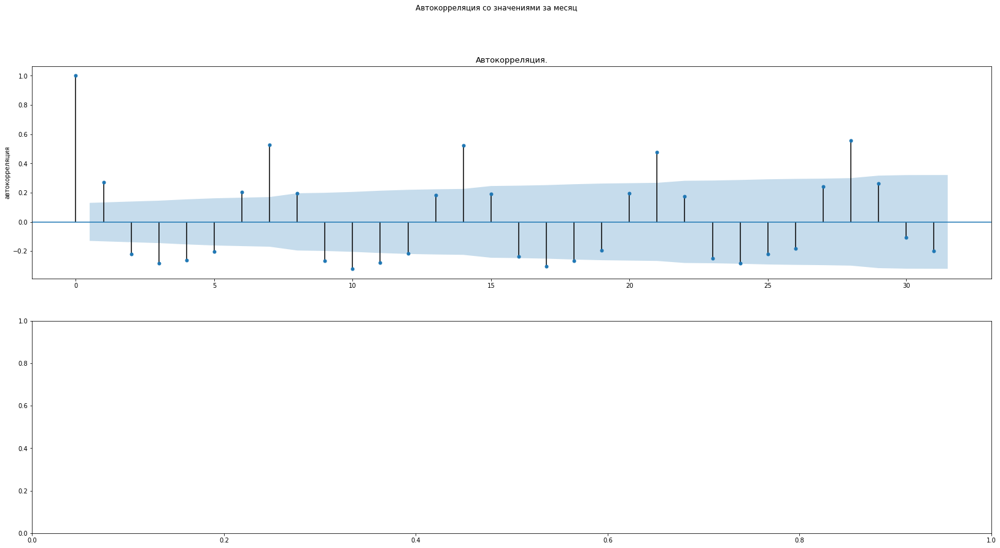

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(28, 14))
fig.suptitle('Автокорреляция со значениями за месяц')
plot_autocorrelation(axes, train_df_2017.sales, lags=31)

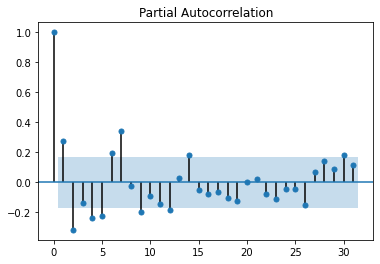

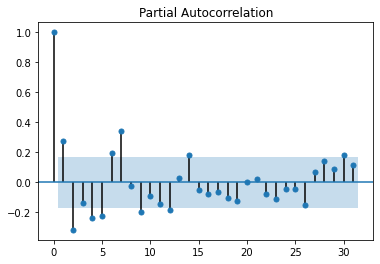

In [ ]:
sm.graphics.tsa.plot_pacf(train_df_2017.sales, lags=31, method="ywm", alpha=0.01)

Ипользуем 7

#**Feature engineering**

Напишем функции для генерации дополнительных признаков. Есть информация о праздниках,  есть рабочие дни.  Выявим рабочий/выходной день (с учетом переносов). Далее изучим скользящую среднюю нефти  и введем новый столбец - индекс дня недели. А также сгруппируем все по номеру магазина и номенклатуре продаваемых товаров.

In [ ]:
def get_calendar():

    events_df = create_events_df()


    calendar = pd.DataFrame({"date" : pd.date_range('2013-01-01', '2017-08-31')} )

    calendar = add_events_df_columns(calendar)
    calendar = add_dofw_column(calendar)
    calendar = add_wd_column(calendar)
    calendar = add_dcoilwtico_column(calendar)
    calendar = add_rolling_mean_oil_column(calendar, 7)


    calendar["date"] = calendar.date.dt.to_period('D')
    calendar = calendar.set_index("date")


    calendar = calendar[ ["dofw", "type", "wd",  "dcoilwtico", "oil_ma7"] ]
    calendar["type"] = calendar["type"].fillna("None")


    return calendar




def get_y():
    df_train = pd.read_csv('drive/MyDrive/Colab/store_sales/train.csv',
                           usecols=['store_nbr', 'family', 'date', 'sales'],
                           dtype={'store_nbr': 'category', 'family': 'category', 'sales': 'float32'},
                           parse_dates=['date'], infer_datetime_format=True)
    df_train.date = df_train.date.dt.to_period('D')
    df_train = df_train.set_index(['store_nbr', 'family', 'date']).sort_index()

    y = df_train.unstack(['store_nbr', 'family'])


    return y




def add_events_df_columns(calendar):
    events_df = create_events_df()
    calendar = calendar.merge(events_df, on="date", how='left')

    return calendar



def add_dcoilwtico_column(calendar):
    oil_df = create_oil_df()
    calendar = calendar.merge(oil_df, on="date", how="left")
    calendar["dcoilwtico"] = calendar["dcoilwtico"].fillna(method="ffill")

    return calendar


def add_rolling_mean_oil_column(calendar, num):
    calendar[f"oil_ma{num}"]  = calendar['dcoilwtico'].rolling(num).mean()
    calendar[f"oil_ma{num}"]  = calendar[f"oil_ma{num}"].fillna(method="ffill")

    return calendar



def add_dofw_column(calendar):
    calendar['dofw'] = calendar["date"].apply(lambda x: x.dayofweek)
    return calendar


def add_wd_column(calendar):
    calendar['wd'] = True

    calendar.loc[calendar.dofw > 4, 'wd'] = False
    calendar.loc[calendar.type == 'Bridge'  , 'wd'] = False
    calendar.loc[calendar.type == 'Work Day', 'wd'] = True
    calendar.loc[calendar.type == 'Transfer', 'wd'] = False
    calendar.loc[(calendar.type == 'Holiday') & (calendar.transferred == False), 'wd'] = False
    calendar.loc[(calendar.type == 'Holiday') & (calendar.transferred == True ), 'wd'] = True


    return calendar




def fill_na(calendar):
    calendar["type"] = calendar["type"].fillna("None")
    return calendar


def create_oil_df():
    oil_df = pd.read_csv(path / 'drive/MyDrive/Colab/store_sales/oil.csv', parse_dates=['date'], infer_datetime_format=True)
    return oil_df






def create_events_df():
    events_df = pd.read_csv('drive/MyDrive/Colab/store_sales/holidays_events.csv', parse_dates=['date'], infer_datetime_format=True)
    events_df['date'] = events_df['date'].replace({'2013-04-29' :
                                                 pd.to_datetime('2013-03-29')}) # 'Good Friday' mistake correction

    events_df = events_df.sort_values(by="date")
    events_df = events_df[events_df.locale == 'National']
    events_df = events_df.groupby(by="date").first()


    return events_df

# MODEL

Тестовая метрика по номенклатуре товаров категории SCHOOL AND OFFICE SUPPLIES выше, что может плохо сказаться на итоговом результате предсказания. Для категории SCHOOL AND OFFICE SUPPLIES используем случайный лес, для остальных категорий воспользуемся Ридж-регрессией.

In [ ]:
class CustomRegressor():

    def __init__(self, n_jobs=-1, verbose=0, alpha=0.6):

        self.n_jobs = n_jobs
        self.verbose = verbose

        self.estimators_ = None

        self.alpha = alpha

    def _estimator_(self, X_ridge, X_rf, y):

        warnings.simplefilter(action='ignore', category=FutureWarning)

        if y.name[2] == 'SCHOOL AND OFFICE SUPPLIES':
            model = RandomForestRegressor(n_estimators = 300, n_jobs=-1, random_state=1)
            X = X_rf
            choice = 0
        else:
            model = Ridge(fit_intercept=True, solver='auto', alpha=self.alpha, normalize=True)
            X = X_ridge
            choice = 1

        model.fit(X, y)


        return model, choice

    def fit(self, X_ridge, X_rf, y):

        self.estimators_ =  Parallel(n_jobs=self.n_jobs,
                                  verbose=self.verbose,
                                  )(delayed(self._estimator_)(X_ridge, X_rf, y.iloc[:, i]) for i in range(y.shape[1]))

        return

    def predict(self, X_ridge, X_rf):
        X = [X_rf, X_ridge]


        y_pred = Parallel(n_jobs=self.n_jobs,
                              verbose=self.verbose)(delayed(self.estimators_[i][0].predict)(X[self.estimators_[i][1]])  for i in range(len(self.estimators_)))

        return np.stack(y_pred, axis=1)

# Train model

Преобразовываем временные реды в частоты (трансформация Фурье)

In [ ]:
def get_ridge_full(order):
    fourier = CalendarFourier(freq='W', order=order)
    dp = DeterministicProcess(index=df.index,
                              constant=False,
                              order=1,
                              seasonal=False,
                              additional_terms=[fourier],
                              drop=True)

    X = dp.in_sample()
    X_ridge_full = X_ridge.copy()

    for c in X.columns:
        X_ridge_full[c] = X[c].values



    return X_ridge_full


def get_rf_full():
    fourier = CalendarFourier(freq='W', order=0)
    dp = DeterministicProcess(index=df.index,
                              constant=False,
                              order=1,
                              seasonal=False,
                              additional_terms=[fourier],
                              drop=True)

    X = dp.in_sample()


    X_rf_full = X_rf.copy()

    for c in X.columns:
        X_rf_full[c] = X[c].values


    return X_rf_full


def add_month_column(X, dummies=True):
    X["month"] = [x.month for x in X.index]
    if dummies:
        X = pd.get_dummies(X, columns=['month'], drop_first=False)

    return X


def add_season_column(X, dummies=True):
    X["season"] = [x.month // 3 for x in X.index]
    X = pd.get_dummies(X, columns=['season'], drop_first=False)

    return X



train_start = '2017-04-15'
train_end = '2017-07-15'

val_start = '2017-07-15'
val_end = '2017-08-15'


test_start = '2017-08-16'
test_end = '2017-08-31'

order = 3
add_rolling_mean_14 = 1
add_rolling_mean_30 = 0
add_month = 0
add_season = 1
alpha = 1.125



df = get_calendar()
y = get_y()

y = y.loc['2017-01-01':]
df = df.loc['2017-01-01':]


le = LabelEncoder()
X_rf = df[["dofw", "wd", "dcoilwtico", "type", "oil_ma7"]].copy()
X_rf["type"] = le.fit_transform(X_rf["type"])



X_ridge = df[["dofw", "wd", "dcoilwtico", 'type', "oil_ma7"]].copy()
X_ridge = pd.get_dummies(X_ridge, columns=['dofw'], drop_first=True)
X_ridge = pd.get_dummies(X_ridge, columns=['type'])
X_ridge = X_ridge.drop(["type_None"], axis=1)


X_ridge_full = get_ridge_full(order)
X_rf_full = get_rf_full()


if add_rolling_mean_14:
    X_ridge_full = add_rolling_mean_oil_column(X_ridge_full, 14)
    X_rf_full = add_rolling_mean_oil_column(X_rf_full, 14)


if add_rolling_mean_30:
    X_ridge_full = add_rolling_mean_oil_column(X_ridge_full, 30)
    X_rf_full = add_rolling_mean_oil_column(X_rf_full, 30)

if add_month:
    X_ridge_full = add_month_column(X_ridge_full, dummies=True)
    X_rf_full = add_month_column(X_rf_full)

if add_season:
    X_ridge_full = add_season_column(X_ridge_full, dummies=True)
    X_rf_full = add_season_column(X_rf_full)


X_ridge_full.drop(["dcoilwtico"], axis=1, inplace=True)
X_rf_full.drop(["dcoilwtico"], axis=1, inplace=True)



X_ridge_full_train = X_ridge_full.loc[train_start:train_end]
X_rf_full_train = X_rf_full.loc[train_start:train_end]

y_train = y.loc[train_start:train_end]

X_ridge_full_val = X_ridge_full.loc[val_start:val_end]
X_rf_full_val = X_rf_full.loc[val_start:val_end]

y_val = y.loc[val_start:val_end]


X_ridge_full_test = X_ridge_full.loc[test_start:test_end]
X_rf_full_test = X_rf_full.loc[test_start:test_end]

In [ ]:
model = CustomRegressor(n_jobs=-1, verbose=0, alpha=alpha)
model.fit(X_ridge_full_train, X_rf_full_train, y_train)

In [ ]:
y.head()

sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-01-01        0.0       0.0    0.0       0.0   0.0     0.000000   
2017-01-02        5.0       0.0    0.0    1434.0   0.0   166.819000   
2017-01-03        4.0       0.0    4.0    3081.0   2.0   519.348022   
2017-01-04        1.0       0.0    4.0    3039.0   2.0   543.250977   
2017-01-05        2.0       0.0    3.0    2617.0   0.0   533.479980   

                                                     ...            \
store_nbr                                            ...         9   
family     CELEBRATION CLEANING   DAIRY        DELI  ... MAGAZINES   
date                                                 ...             
2017-01-01         0.0      0.0     0.0    0.000000  ...       0.0   
2017-01-02         0.0    332.0   376.0   44.980000  ...       5.0   
2017-01-03        15.0    952.0  1045.0  209.300003  ...       2.0   
2017-01-04        17.0   1055.0  1029.0  135.944000  ...       3.0   
2017-01-05        40.0    918.0   853.0  137.005997  ...       2.0   

                                                                           \
store_nbr                                                                   
family           MEATS PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS   
date                                                                        
2017-01-01    0.000000           0.0          0.0                     0.0   
2017-01-02  659.570007        1243.0         11.0                    41.0   
2017-01-03  547.364014         876.0          6.0                    15.0   
2017-01-04  395.287994         677.0          6.0                    13.0   
2017-01-05  470.768005         604.0          7.0                    10.0   

                                                                               \
store_nbr                                                                       
family         POULTRY PREPARED FOODS      PRODUCE SCHOOL AND OFFICE SUPPLIES   
date                                                                            
2017-01-01    0.000000       0.000000     0.000000                        0.0   
2017-01-02  843.596008     115.188995  3136.895996                        1.0   
2017-01-03  714.659973     133.039001  3229.558105                        1.0   
2017-01-04  536.830017      75.201004  1491.416992                        7.0   
2017-01-05  414.100006     113.698997  1566.821045                        1.0   

                    
store_nbr           
family     SEAFOOD  
date                
2017-01-01     0.0  
2017-01-02    23.0  
2017-01-03    14.0  
2017-01-04     0.0  
2017-01-05    17.0  

[5 rows x 1782 columns]

In [ ]:
val_pred = model.predict(X_ridge_full_val, X_rf_full_val)

In [ ]:
y_val.shape

(32, 1782)

**Валидация**

In [ ]:
from sklearn.metrics import mean_squared_error, mean_squared_log_error

In [ ]:
mse_val = {}
for i in range(y_val.shape[1]):
  mse_val[y_val.iloc[:, i].name[2]] = mean_squared_error(val_pred[:, i], y_val.iloc[:, i])

In [ ]:
from sklearn.preprocessing import minmax_scale

In [ ]:
val_pred_norm = minmax_scale(val_pred, feature_range=[0,1])
y_val_norm = minmax_scale(y_val, feature_range=[0,1])

In [ ]:
rmsle_val = {}
for i in range(y_val.shape[1]):
  rmsle_val[y_val.iloc[:, i].name[2]] = np.sqrt(mean_squared_log_error(val_pred_norm[:, i], y_val_norm[:, i]))

**MSE - качество**

In [ ]:
mse_val

{'AUTOMOTIVE': 30.944460891991888,
 'BABY CARE': 0.668894944325912,
 'BEAUTY': 17.546743097627257,
 'BEVERAGES': 471787.16667791374,
 'BOOKS': 0.0,
 'BREAD/BAKERY': 11322.869187107219,
 'CELEBRATION': 45.641199702831244,
 'CLEANING': 406627.8463101023,
 'DAIRY': 33486.39470522309,
 'DELI': 12621.67082525102,
 'EGGS': 3142.572688568205,
 'FROZEN FOODS': 742.6713699213257,
 'GROCERY I': 1922883.4143501874,
 'GROCERY II': 52.89973069452808,
 'HARDWARE': 1.5214236211950019,
 'HOME AND KITCHEN I': 188.78848843600954,
 'HOME AND KITCHEN II': 149.12599687768991,
 'HOME APPLIANCES': 0.2372118260592472,
 'HOME CARE': 10859.227660361597,
 'LADIESWEAR': 81.63057692738374,
 'LAWN AND GARDEN': 23.16709244878986,
 'LINGERIE': 24.315055295273616,
 'LIQUOR,WINE,BEER': 222.34383042595232,
 'MAGAZINES': 7.133850601152401,
 'MEATS': 4941.92542015645,
 'PERSONAL CARE': 12487.581322951304,
 'PET SUPPLIES': 13.208344138596624,
 'PLAYERS AND ELECTRONICS': 15.248376166462013,
 'POULTRY': 8268.055113767383,
 '

**RMSLE - качество**

In [ ]:
rmsle_val

{'AUTOMOTIVE': 0.2593620553705754,
 'BABY CARE': 0.34879549846739794,
 'BEAUTY': 0.24748820503939714,
 'BEVERAGES': 0.16017984126424553,
 'BOOKS': 0.0,
 'BREAD/BAKERY': 0.1798850592532449,
 'CELEBRATION': 0.2255223432069027,
 'CLEANING': 0.2820963913145949,
 'DAIRY': 0.15960028029065162,
 'DELI': 0.1756660690426489,
 'EGGS': 0.15566699583860977,
 'FROZEN FOODS': 0.1986893184215588,
 'GROCERY I': 0.22133372761968667,
 'GROCERY II': 0.22841919269265018,
 'HARDWARE': 0.27321218127167735,
 'HOME AND KITCHEN I': 0.22605233035223504,
 'HOME AND KITCHEN II': 0.17843236774864152,
 'HOME APPLIANCES': 0.33387971410096884,
 'HOME CARE': 0.22595279791687542,
 'LADIESWEAR': 0.25649661530978424,
 'LAWN AND GARDEN': 0.27436870997037766,
 'LINGERIE': 0.3049580988732746,
 'LIQUOR,WINE,BEER': 0.13267770880657886,
 'MAGAZINES': 0.27416820175008144,
 'MEATS': 0.14293485474449522,
 'PERSONAL CARE': 0.20995088104068077,
 'PET SUPPLIES': 0.3036230719224703,
 'PLAYERS AND ELECTRONICS': 0.21626776694690977,
 '

Подготовим submission по первой модели

In [ ]:
y_pred = model.predict(X_ridge_full_test, X_rf_full_test)

In [ ]:
y_pred = pd.DataFrame(y_pred, index=df.loc[test_start:test_end].index, columns=y.columns)
y_pred = y_pred.stack(['store_nbr', 'family'])
y_pred[y_pred < 0] = 0.

submission1 = pd.read_csv('drive/MyDrive/Colab/store_sales/sample_submission.csv', index_col='id')
submission1.sales = y_pred.values
submission1.to_csv('submission1.csv', index=True)

In [ ]:
submission1

,sales
id,
3000888,4.314292
3000889,0.000000
3000890,4.083761
3000891,2496.649799
3000892,0.681500
...,...
3029395,369.400353
3029396,110.740987
3029397,1423.766052


# Проверим Prophet с использованием скользящего среднего

In [ ]:
# формируем календарь
calendar = pd.DataFrame(data = pd.date_range('2013-01-01', '2017-08-15'))
calendar = calendar.rename(columns={calendar.columns[0]: 'date'})
display(calendar.tail(3))

,date
1685,2017-08-13
1686,2017-08-14
1687,2017-08-15


In [ ]:
# определяем среднее
# avg_sales_df = df_data[['date', 'sales']].copy(deep=True)
avg_sales_df = train_df.groupby('date').mean()['sales'].to_frame()
avg_sales_df.reset_index(inplace = True)
# avg_sales_df = calendar.merge(avg_sales_df, how = 'left', on='date')
avg_sales_df = avg_sales_df.rename(columns={'date': 'ds', 'sales': 'y'})
# avg_sales_df.set_index('ds', inplace=True)
display(avg_sales_df.tail(3))
# Судя по коичеству в avg_sales_df пропущено около 4 дат.
# avg_sales_df ['ds'].iloc[0]
# avg_sales_df.shape

,ds,y
1681,2017-08-13,485.768618
1682,2017-08-14,427.004717
1683,2017-08-15,427.980884


In [ ]:
avg_sales_df['y'].fillna(value = 0, inplace = True)

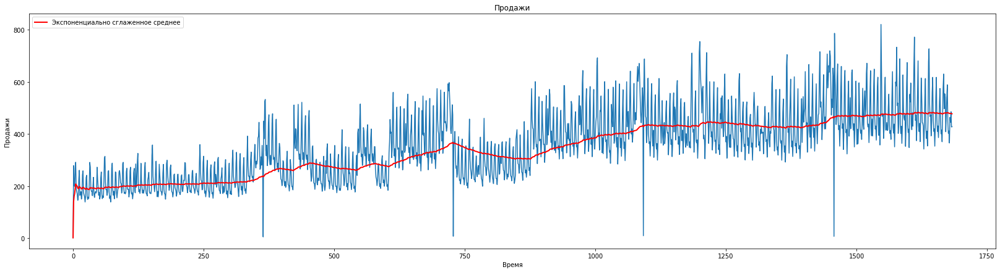

In [ ]:
# Зависимость цены от времени
plt.figure(figsize = (28, 7))
plt.title("Продажи")
plt.plot(avg_sales_df.index, avg_sales_df.y)
plt.plot(avg_sales_df.index,
         avg_sales_df.y.ewm(alpha=0.01).mean(),
         color='red',
         linewidth=2,
         label='Экспоненциально сглаженное среднее'
        )
plt.xlabel("Время")
plt.ylabel("Продажи")
plt.legend().get_frame().set_facecolor('white')
plt.show()

Сгладим ряд при помощи скользящего среднего

In [ ]:
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):

    """
        series - dataframe with timeseries
        window - rolling window size
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies

    """
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(28,7))
    plt.title("Скользящее среднее\n размер окна = {}".format(window))
    plt.plot(series[window:], label="Фактические значения")
    plt.plot(rolling_mean, "r", label="Тренд скользящее среднее")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")

    plt.legend(loc="upper left")
    plt.grid(True)

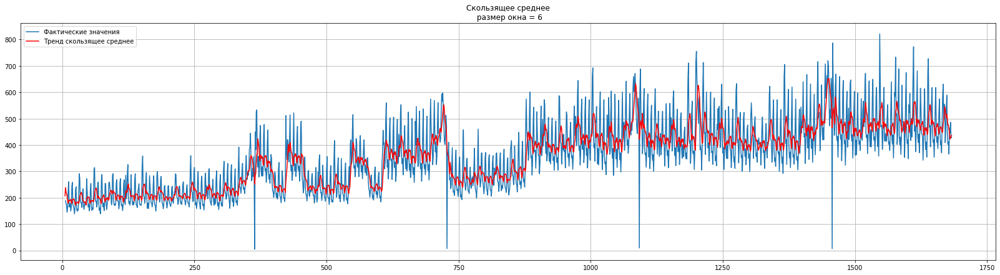

In [ ]:
plotMovingAverage(avg_sales_df['y'], window=6)


**Создаем модель Prophet и обучаем ее**

In [ ]:
!pip install fbprophet

In [ ]:
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly

In [ ]:
m = Prophet()
m.fit(avg_sales_df)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
# display(train_df.tail(5))

 make_future_dataframe создает датафрейм-заготовку с будущими датами, для которых модель будет строить прогноз Periods - это на сколько дней вперед нужно построить прогноз.

In [ ]:
future = m.make_future_dataframe(periods = len(train_df.date.unique()))
# future.info()

In [ ]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head(5)

,ds,yhat,yhat_lower,yhat_upper
0,2013-01-01,212.809928,136.036646,295.265632
1,2013-01-02,219.745136,136.120631,294.495602
2,2013-01-03,164.041561,88.278201,242.346074
3,2013-01-04,199.605569,123.499577,286.928580
4,2013-01-05,300.607545,223.821636,376.889895


In [ ]:
forecast_vsl = forecast[(forecast['ds'] > '2013-01-01') & (forecast['ds'] < '2019-01-01')]
display(forecast_vsl.tail(3))

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
2184,2018-12-29,573.707955,642.933878,818.506875,538.425338,608.179009,159.713409,159.713409,159.713409,75.219725,75.219725,75.219725,84.493684,84.493684,84.493684,0.0,0.0,0.0,733.421364
2185,2018-12-30,573.851283,677.210276,842.882142,538.446573,608.474222,184.359016,184.359016,184.359016,105.717899,105.717899,105.717899,78.641116,78.641116,78.641116,0.0,0.0,0.0,758.210299
2186,2018-12-31,573.994612,550.099847,723.676043,538.455410,608.731883,60.577233,60.577233,60.577233,-11.837114,-11.837114,-11.837114,72.414348,72.414348,72.414348,0.0,0.0,0.0,634.571845


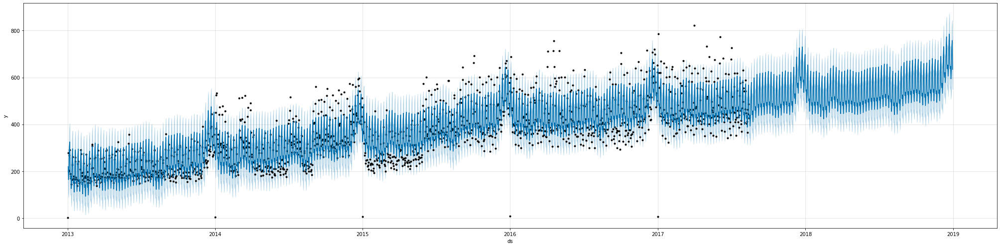

In [ ]:
fig1 = m.plot(forecast_vsl, figsize=(28, 7))

Расчитаем тренд с помощью Prophet и выявим годовую и недельную сезонность

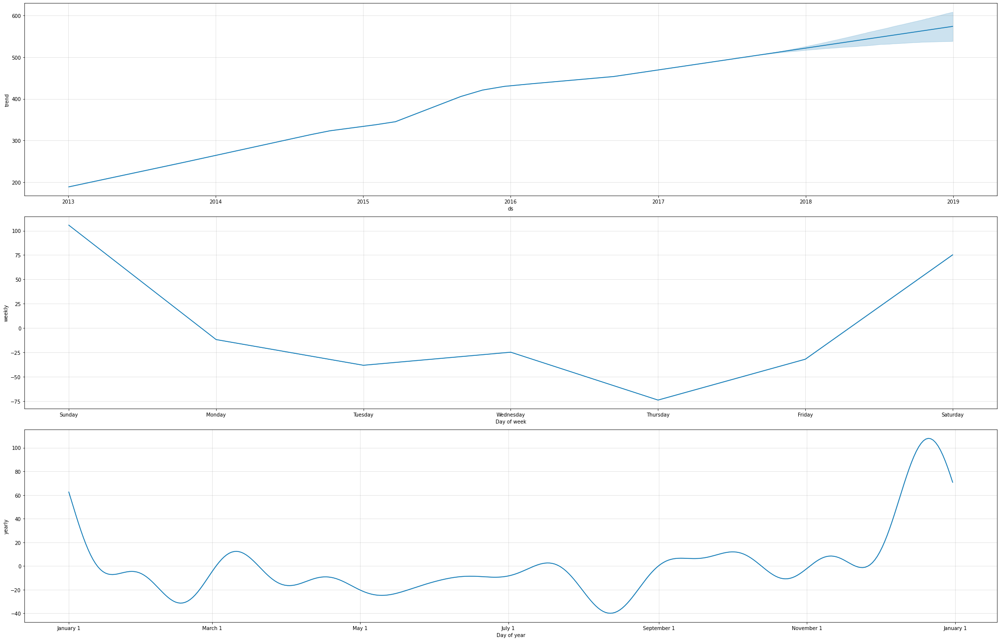

In [ ]:
fig2 = m.plot_components(forecast_vsl, figsize=(28, 18))

In [ ]:
from fbprophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast_vsl, figsize = (1500,700))



---



# Предскажем продажи по магазинам

In [ ]:
def plot_multi_ts(df, feature, n_cols=6, run_forecast=False, ds_range=None, periods=None, days_to_plot=None):

    group_by_store_df = df.groupby(['ds'] + [feature]).agg({'y': 'sum'}).reset_index()
    stores = list(set(group_by_store_df[feature]))
    n_rows = int(len(stores)/n_cols)
    fig, ax = plt.subplots(n_rows, n_cols, figsize=(40, 40))

    k = 0
    forecasts = []
    for i in tqdm(range(n_rows)):
        for j in range(n_cols):
            ts = group_by_store_df[group_by_store_df[feature] == stores[k]]

            if run_forecast:
                df = ts[['ds', 'y']]
                df = df[(df.ds >= ds_range[0]) & (df.ds <= ds_range[1])]

                # with suppress_stdout_stderr():
                m = Prophet()
                m.fit(df)
                future = m.make_future_dataframe(periods=periods)
                forecast = m.predict(future)

                kwargs = {feature: lambda x: stores[k]}
                forecast = forecast.assign(**kwargs).rename(columns={'yhat': 'yhat_'  + feature})
                forecasts.append(forecast)
                ax[i][j].plot(ts[-days_to_plot:].ds, ts[-days_to_plot:].y)
                ax[i][j].plot(forecast[-periods:].ds, forecast[-periods:][['yhat_'  + feature]])
            else:
                ax[i][j].plot(ts.ds, ts.y)

            ax[i][j].set_title(feature + ": " + str(stores[k]), size=16)
            k += 1

    if run_forecast:
        forecast_per_feature = pd.concat(forecasts, axis=0)
        forecast_per_feature = pd.merge(group_by_store_df.rename(columns={'y': 'y_' + feature}), forecast_per_feature[['ds', 'yhat_' + feature] + [feature]], on=['ds'] + [feature], how='left')

        return forecast_per_feature

In [ ]:
train_df_ts = train_df.copy()
train_df_ts = train_df_ts.rename(columns={'date' : 'ds','sales':'y'})
display(train_df_ts.head(5))

,id,ds,store_nbr,family,y,onpromotion,year,month,day_of_week
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,2013,January,Tuesday
1,1,2013-01-01,1,BABY CARE,0.0,0,2013,January,Tuesday
2,2,2013-01-01,1,BEAUTY,0.0,0,2013,January,Tuesday
3,3,2013-01-01,1,BEVERAGES,0.0,0,2013,January,Tuesday
4,4,2013-01-01,1,BOOKS,0.0,0,2013,January,Tuesday


100%|██████████| 9/9 [00:00<00:00, 23.28it/s]


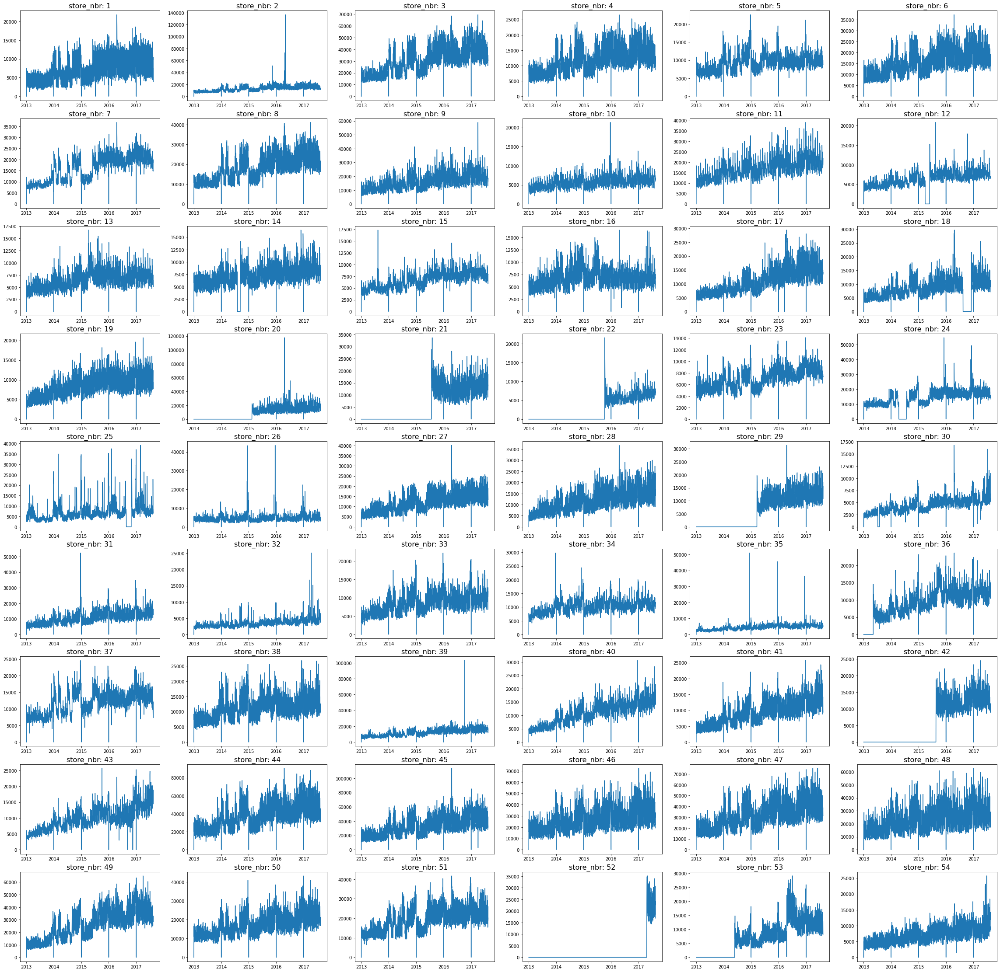

In [ ]:
plot_multi_ts(train_df_ts, 'store_nbr', run_forecast=False)

Несколько замечаний:
*   по всем магазинам заметен восходящий тренд
*   некоторые магазины, как например 42, 29, 22, 21, 20 открылись не так давно (2015)



In [ ]:
ds_range_min = '2013-01-01'
ds_range_max = str(train_df_ts.iloc[-1].ds)[:10]
ds_periods = 15
ds_days_to_plot = 365
print('Start date: ' + str(ds_range_min))
print('End date: ' + str(ds_range_max))
print('Periods: ' + str(ds_periods))

Start date: 2013-01-01
End date: 2017-08-15
Periods: 15


  0%|          | 0/9 [00:00<?, ?it/s]INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
 11%|█         | 1/9 [00:37<05:02, 37.86s/it]INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


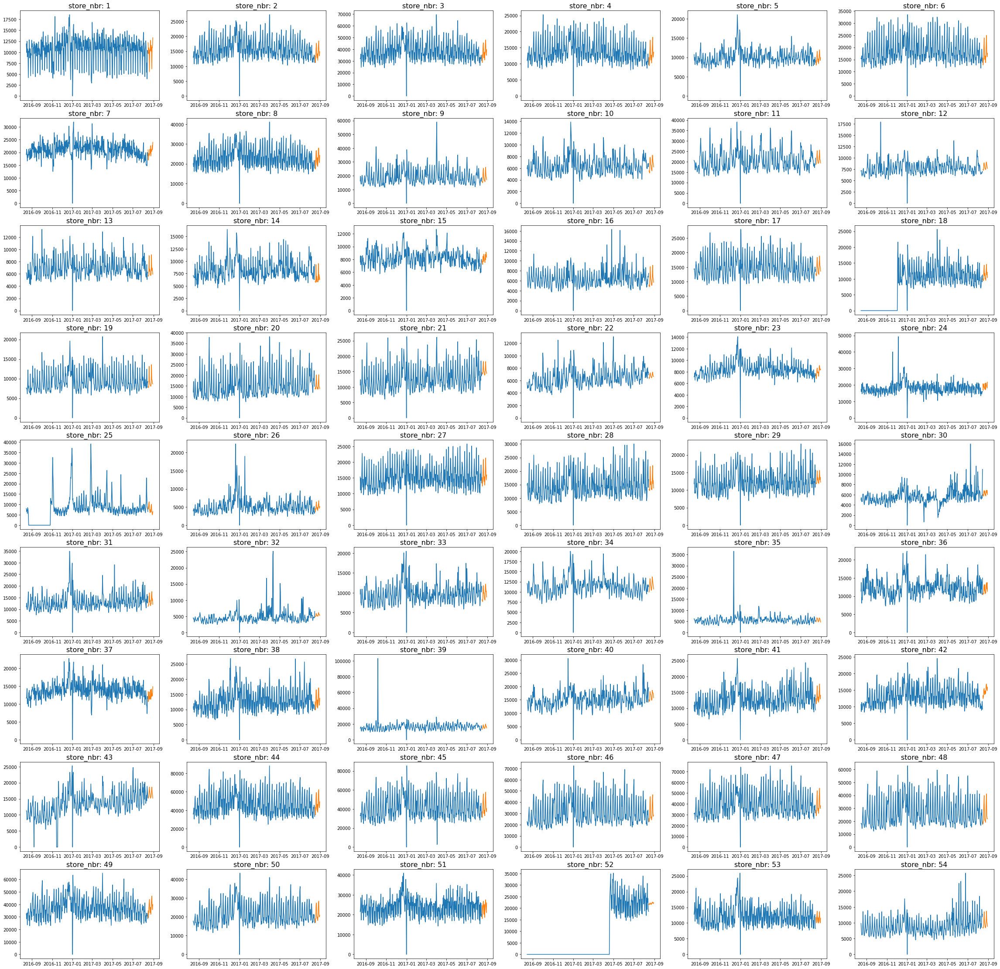

In [ ]:
# Сделаем предсказание
forecast_per_store = plot_multi_ts(train_df_ts, 'store_nbr', run_forecast=True, ds_range=[ds_range_min, ds_range_max], periods = ds_periods, days_to_plot = ds_days_to_plot)

В целом прогнозы выглядят не плохо, если не учитывать магазины, по которым нет истории, например магазин 52, 20, 21, 22

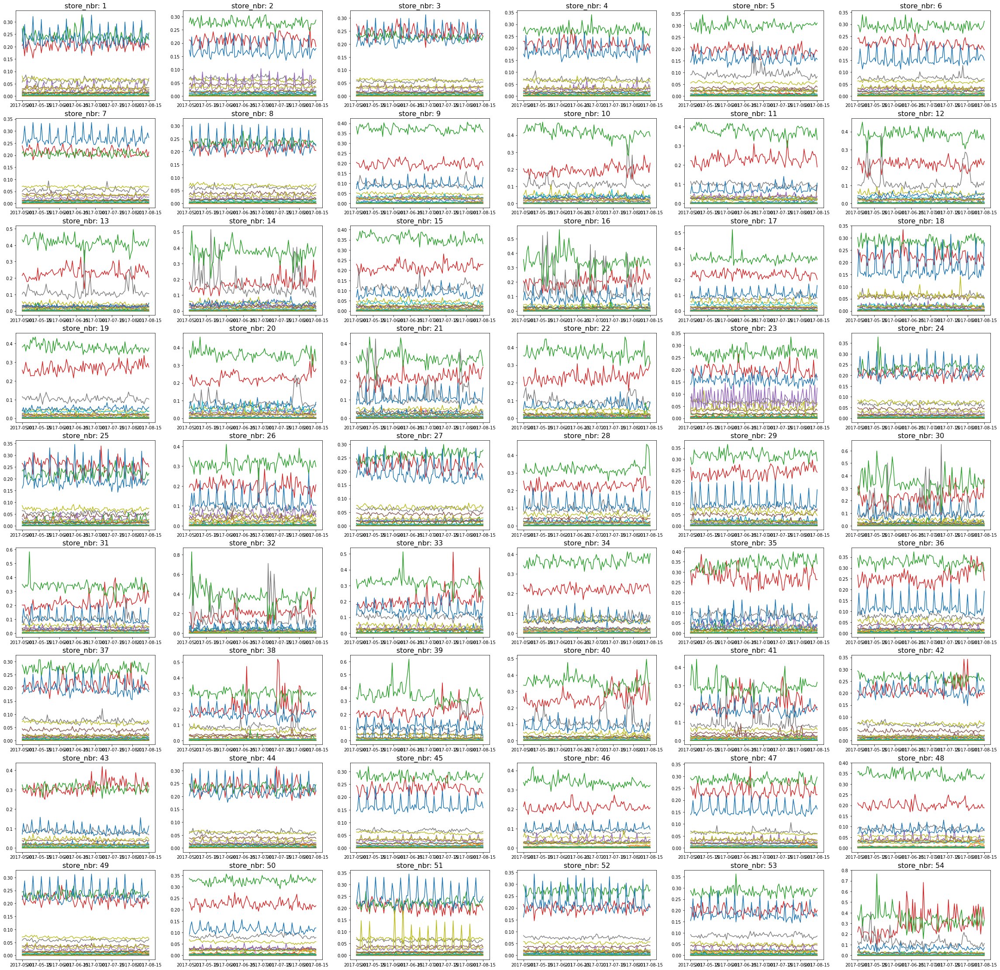

In [ ]:
train_df_ts = pd.merge(train_df_ts, forecast_per_store, on=['ds', 'store_nbr'], how='left')
train_df_ts = train_df_ts.assign(prop_family_per_store = train_df_ts.y/train_df_ts.y_store_nbr).fillna(0)
# display(train_df_ts.tail(5))
group_by_store_df = train_df_ts.groupby(['ds'] + ['store_nbr']).agg({'y': 'sum'}).reset_index()
stores = list(set(group_by_store_df.store_nbr))
# Определим размеры для графика
n_cols = 6
n_rows = int(len(stores)/n_cols)

fig, ax = plt.subplots(n_rows, n_cols, figsize=(40, 40))

k = 0
for i in range(n_rows):
    for j in range(n_cols):
        sub_df = train_df_ts[train_df_ts.store_nbr == stores[k]]
        sub_df = sub_df[sub_df.ds >= '2017-05-01']
        for f in train_df_ts.family.unique():
            ts = sub_df[sub_df.family == f]
            ax[i][j].plot(ts.ds, ts.prop_family_per_store)
            ax[i][j].set_title("store_nbr: " + str(stores[k]), size=16)
        k += 1

In [ ]:
# Добавим колонки, которые считают разницу относительно последней недели
train_df_ts = train_df_ts.assign(diff_from_max_train_ds = train_df_ts.ds - datetime.strptime(ds_range_max, "%Y-%m-%d")) # крайняя дата
train_df_ts = train_df_ts.assign(nb_weeks=np.ceil(train_df_ts.diff_from_max_train_ds.dt.days/7).astype('int')) # номер недели начиная с последней недели
train_df_ts = train_df_ts.assign(last_week_ds= train_df_ts.ds - (train_df_ts.nb_weeks*7).map(lambda x: timedelta(x))) #
# display(train_df_ts.head(3))
# display(train_df_ts.tail(10))

In [ ]:
train_df_ts = pd.merge(train_df_ts,
                       train_df_ts[['ds', 'store_nbr', 'family', 'prop_family_per_store']].rename(columns={'prop_family_per_store': 'last_week_prop_family_per_store'}),
                       left_on = ['last_week_ds', 'store_nbr', 'family'],
                       right_on=['ds', 'store_nbr', 'family'],
                       how='left'
                      )
train_df_ts.drop(['diff_from_max_train_ds', 'nb_weeks', 'last_week_ds', 'ds_y'], axis=1)
train_df_ts = train_df_ts.rename(columns={'ds_x': 'ds'})
train_df_ts = train_df_ts.assign(yhat = train_df_ts.yhat_store_nbr * train_df_ts.last_week_prop_family_per_store)

In [ ]:
test_df_ts = test_df.copy()
test_df_ts = test_df.rename(columns={'date' : 'ds','sales':'y'})
# display(test_df_ts.head(5))

In [ ]:
ds_periods_test = len(test_df_ts.ds.unique())
ds_days_to_plot = 365
print('Start date: ' + str(ds_range_min))
print('End date: ' + str(ds_range_max))
print('Periods: ' + str(ds_periods_test))
# display(train_df_ts.head(5))

Start date: 2013-01-01
End date: 2017-08-15
Periods: 16


In [ ]:
ds_range = [ds_range_min, ds_range_max]
periods = len(test_df_ts.ds.unique())
days_to_plot = 365

binded_df_ts = pd.concat([train_df_ts, test_df_ts], axis=0)

  0%|          | 0/9 [00:00<?, ?it/s]INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
 11%|█         | 1/9 [00:26<03:29, 26.14s/it]INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


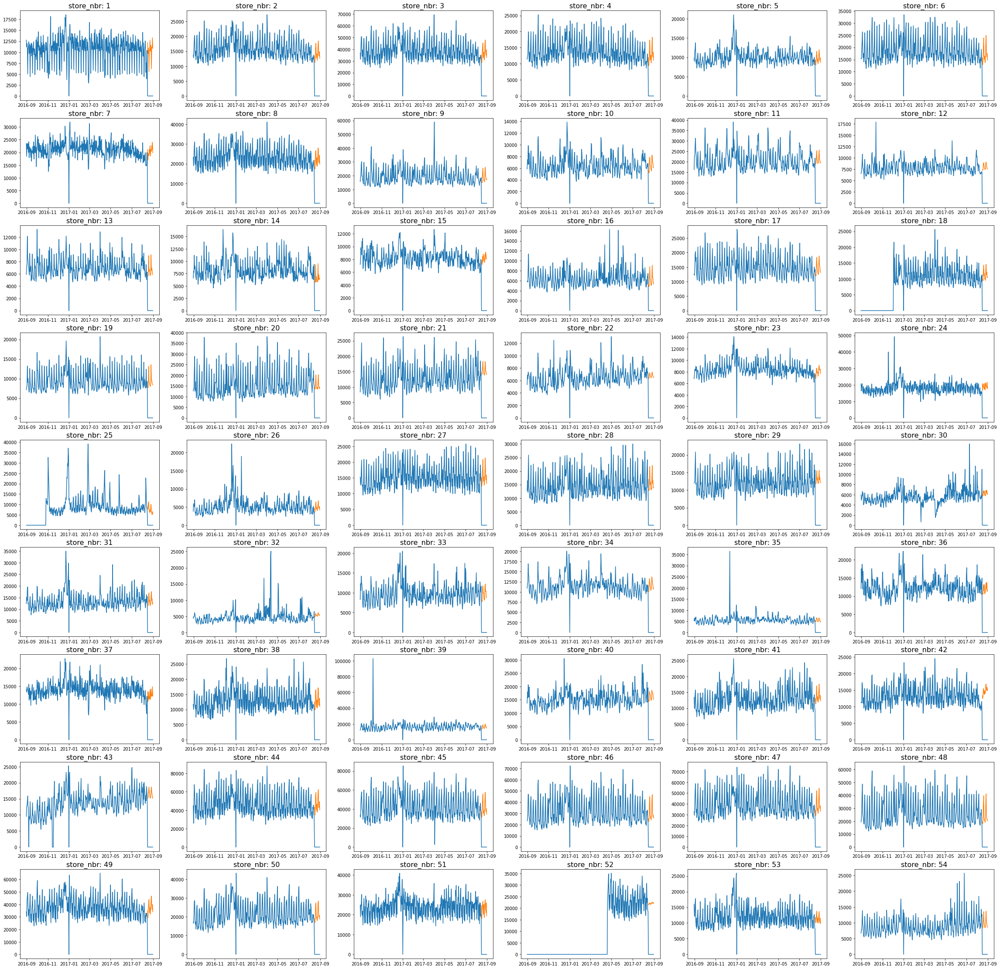

In [ ]:
forecast_per_store = plot_multi_ts(binded_df_ts, 'store_nbr', run_forecast=True, ds_range=ds_range, periods=len(test_df_ts.ds.unique()), days_to_plot=days_to_plot)

# Готовим Submission

In [ ]:
# Построим предсказание
train_df_p = train_df.copy()
train_df_p = train_df_p.rename(columns={'date' : 'ds','sales':'y'})
test_df_p = test_df.copy()
test_df_p = test_df_p.rename(columns={'date' : 'ds','sales':'y'})
df = pd.concat([train_df_p, test_df_p], axis=0)
df = pd.merge(df, forecast_per_store, on=['ds', 'store_nbr'], how='left')
df = df.assign(prop_family_per_store = df.y/df.y_store_nbr)
df.prop_family_per_store = df.prop_family_per_store.fillna(0)

# df = get_last_available_week(df)
# df = get_yhat(df)

In [ ]:
# Добавим колонки, которые считают разницу относительно последней недели
df = df.assign(diff_from_max_train_ds = df.ds - datetime.strptime(ds_range_max, "%Y-%m-%d")) # крайняя дата
df = df.assign(nb_weeks=np.ceil(df.diff_from_max_train_ds.dt.days/7).astype('int')) # номер недели начиная с последней недели
df = df.assign(last_week_ds= df.ds - (df.nb_weeks*7).map(lambda x: timedelta(x))) #

In [ ]:
df = pd.merge(df,
              df[['ds', 'store_nbr', 'family', 'prop_family_per_store']].rename(columns={'prop_family_per_store': 'last_week_prop_family_per_store'}),
              left_on = ['last_week_ds', 'store_nbr', 'family'],
              right_on=['ds', 'store_nbr', 'family'],
              how='left'
              ).drop(['diff_from_max_train_ds', 'nb_weeks', 'last_week_ds', 'ds_y'], axis=1).rename(columns={'ds_x': 'ds'})

df = df.assign(yhat=df.yhat_store_nbr * df.last_week_prop_family_per_store)

In [ ]:
# display(df.tail(10))

In [ ]:
# построим временной ряд для yhat, promotion
# plot_ds_range = ['2017-01-01', df.ds.iloc[-1]]
# fig, ax = plt.subplots(figsize=(20, 5))
# key = random.choice(list(set(zip(train_df_p.store_nbr, test_df_p.family))))
# ts = df[(df.store_nbr == key[0]) & (df.family == key[1])]
# ts = ts[(ts.ds >= plot_ds_range[0]) & (ts.ds <= plot_ds_range[1])]
# plt.plot(ts.ds, ts.onpromotion*np.median(ts.y), label='promotion')
# plt.plot(ts.ds, ts.yhat, label='yhat')
# plt.plot(ts.ds, ts.y, label='y')
# plt.title("Store: " + str(key[0]) + ", Family: " + key[1])
# plt.legend()
# ax.set_xticks(np.array(ts.ds)[::100])
# ax.tick_params(axis='x',rotation=45)
# plt.show()

In [ ]:
submission = df.iloc[train_df_p.shape[0]:][['id', 'yhat']]
submission = submission.rename(columns={'yhat' : 'sales'})
submission.set_index('id', inplace = True)
# display(submission.head(5))

In [ ]:
submission.to_csv('submission.csv', index=True)

# Посчитаем параметры модели

In [ ]:
from sklearn import metrics
from sklearn.metrics import mean_absolute_percentage_error

In [ ]:
print('Средняя абсолютная ошибка (MAE):', metrics.mean_absolute_error(df['y'].iloc[:train_df_p.shape[0]], df['yhat'].iloc[:train_df_p.shape[0]]))
print('Средняя абсолютная ошибка (MAPE):', mean_absolute_percentage_error(df['y'].iloc[:train_df_p.shape[0]], df['yhat'].iloc[:train_df_p.shape[0]]))
print('Среднеквадратическая ошибка(MSE):', metrics.mean_squared_error(df['y'].iloc[:train_df_p.shape[0]], df['yhat'].iloc[:train_df_p.shape[0]]))
print('Среднеквадратичная ошибка (RMSE):', np.sqrt(metrics.mean_squared_error(df['y'].iloc[:train_df_p.shape[0]], df['yhat'].iloc[:train_df_p.shape[0]])))
#print('Среднеквадратичная логарифмическая ошибка (RMSLE):', np.sqrt(metrics.mean_squared_log_error(df['y'].iloc[:train_df_p.shape[0]], df['yhat'].iloc[:train_df_p.shape[0]])))

Средняя абсолютная ошибка (MAE): 108.33840146559538
Средняя абсолютная ошибка (MAPE): 5.878863094553055e+16
Среднеквадратическая ошибка(MSE): 167493.47834714092
Среднеквадратичная ошибка (RMSE): 409.2596710490064


In [ ]:
print('Взвешенная абсолютная процентная ошибка  (WAPE):', (df['y'].iloc[:train_df_p.shape[0]] - df['yhat'].iloc[:train_df_p.shape[0]]).abs().sum() / df['y'].iloc[:train_df_p.shape[0]].sum())

Взвешенная абсолютная процентная ошибка  (WAPE): 0.302810913635997
